<a href="https://colab.research.google.com/github/TejasPosupo/Machine_Learning_Projects/blob/main/Solar_Panel_Detection_using_Mask_RCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'coco-solar:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4655774%2F7922364%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D722a7557c25aa22dc54aeeb02f24d4aaeac489246af8c86b95d6fb8e78c9f2af59ca4a83f116d208a4874df7ee2ae6ecb4aaab5b2df1971031816e4b460cda220dd7d1874088effa224ff2ba67bca4dec11a0298e4d669c6e8728ca4f66844650f294957ff963915b394d0c26ac902a3ef862910c78a65554e61d8a71e5eb89251a06376cac94e9c20d634994c8dc48b3d4017514ea8d985ead7b7f40fcc61db8b7e0eddfb6ffa0e9ba6dc44477a2cdb494642511cba21cf4772797bb009f2fa3debbf7655ef411ab9579f013632b0e94e9787d6ca1fd5708a228c381981e7df0073ff84ab64bc8ef1180f4a5615e51aecf267e44b3e050bc919db1a13e18c95,evaluate:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4656772%2F7923842%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D630da6986c7741074ddbc720cea50f68bc8a83599eb27ebbe299222d44eabfa828e3df3457b19186adf80a1c200c3962a9f7defb76494335a4e21e6bb66704f7faeac3ffe64b23a7fb7433eb111763a31acf92b74a01e00052ef76dc0852e7c4565fc30a815aa9544916c1333595837ff1156131f67cadb1cd13ab2cdee8f9868564f8bed3f12cccbca51ffb5462b6007a88a74ea2331e0241205b3d170a9eedcb7fe4a730fcc0e55481ad0f999ffab57e24c0f18ab690fc5f490378c7dbbee59b2b64b37507064e9351ae5f5cdadd10ef7993aaf68afb545bb1d69622b1e3abea55c6907092dbdc88e0a1a21be97cffa40d7112775dd3b1b2b2001b8b69d7f8,high-res:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4657268%2F7924551%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5f6e34f586392970ad07b4fb3043fea51f65046ae7a33991564ab451babbd5fe0c55860403ca1086bd1deb57de96d6c2d2c6e46a51c3b36787b4f6565dac2a7ff7fce2c408a8772629a9105e2e8637372ef7d68cda1c6ee6c93ca21d853e2fa7938a540c605c296fe71bcf92b1ce16209a9350b9d790afd8f9276f1477e7098dcb69fa6dfba78b996d671da3a6ce1b11edba6656603273fcd378731ccb9e961c7cbe89a20117628a55f8c0fec3d03c77fe7f324bd9bc4e1d298fad63a40f1eb7c5b20dddb27b8db3f704517c884b9ab2c155fc14748900570e09a7d5dd1ee9e9b5b78ed7252e07b5b87e84cc95c5b991f5d1074548e359bb54529b06216efa26,high-res-2:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4657313%2F7924617%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D49d4c034b9dd1e9fa367f760d0ea62c9809262c2157cd8d1d8ce650754e610f4495c7454655faf13eea490e4e6e6abe53777b735876a2aa4e05a0a51cfd41c1239a84b75f2928d87746ef3f898c83ab81641cec1c85da49c7fc6f4b3221f2f3ed68a8f05729f2c445810bccf71f267b6f9664a09f29978a362c67de32c3622dde62745d64d44065b90673ace74a0c611cb906a9eaaf84f25efac4113c7ff923bc57a8f768c6a14082fe80fe7b035e40319083a977ea6e921612e91b42be5ddb0b40bae23c22a1926795e6a3177b4bd0958c11dc22d22290efbe71538813df62a8cf8f58a6e293f35cf0565d4f222630b6756050a102d16fa10ef6d20ecc7578d,high-res3:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4657327%2F7924639%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D6a7fd92d33c8ed61a6e71546bf04dcecf73d76cd067555270c101d5c3606c91a0d7bf4c450e4e6b19bbb3af51bd9910399fb3d07f5bf31b2f933ad5da25a043802f7d9a04a3e6a14682dedd7dcc80248324215e74598cfa3117f9cc05c7f640c7d70bf0a1ce42021db16daa1e0368d793790bab4d059dff368ea6fe58ce688dabe7bc346c66fb03eaece0f3c5311c1aa6f649d1394441daea0f789f44af24eb90dd8d40b44dce4d4660dd182133d3edce0dfad367f11a226ba8f236e1addf7e31407df41d61036e06b23932a05cf3bfb097e1d26a426751003147f8fe87df453bd7255169571665940bbfc8bde0c9630a10c7c478785fe675fdb3e0a92e83302,data-para-results:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4658930%2F7927217%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D2a4d8121a7234bdf9e7bbee3e11e6f4e8aa24708970ff21da5d953278b1d184f056c3229e1ab29d90bbe7214738773c6ef91881f9a8d1f1cfb8b08db0955bca1471df65a8c77d2f29d1590c9cf324cbe204d979302555ce2643aa7a276ceb64199314d28691329de1f74ed2eb8dfacac6348a2af98f4dceedf67a2f42f075a5771cfdafaced709a4f414b2b3053b1d1beaf331750ba65aedceea2cd0ac017bd1f7c3950fe06d02f8b074f532f741128e4c30b06495c7791282699f32baa48b07516a0def1ec78553148a6a41e16c1932e3168ee5b0e43a0fe9a79564ee4506c735a90aaca1f53d3e32c5cade30fab6677df86ec182e95e234480002f3515d7dc,final-inputs:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4660174%2F7928910%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240325%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240325T091852Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D367b0a51b555f17f690662c21cc0b3558d303627f71cfe08aad899e14898a0ab745b7a615a3b8e5eaf55946637816aa0aa56c6150b7ae98ad2b63bdd6b7bf8665ff44676f43addc65e26f97440894a4490a2268aa74a13dc9b15e93973d43ecab7edfb30f061d945a137b2f2d072b5bbb7641f55afac176969bce3b9a1c26f2792a80a079088185fec4a9963c5fa2135375524313300184187b7ee17235cfc93db878ffa5c0cc884b4b0c01a5cede175f5bcc410e334766600f0f7bc21bd51179544834e93d743c5c7e22c3c2d359ba6256d5e32c251fac3f9ca854985a9762c3ab25ba59e643229b049d3f3f6270a7c059256e2c44d58048453a1857bb5cce0'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 797579 bytes downloaded
Downloaded and uncompressed: coco-solar
[==================================================] 219553 bytes downloaded
Downloaded and uncompressed: evaluate
[==================================================] 7375283 bytes downloaded
Downloaded and uncompressed: high-res
[==================================================] 7021897 bytes downloaded
Downloaded and uncompressed: high-res-2
[==================================================] 7021896 bytes downloaded
Downloaded and uncompressed: high-res3
[==================================================] 10612986 bytes downloaded
Downloaded and uncompressed: data-para-results
[==================================================] 7021896 bytes downloaded
Downloaded and uncompressed: final-inputs
Data source import complete.


<h1 align="Center" style="font-family: Times New Roman; font-weight: bold; color: blue;"><b>Solar Panel Detection using Detectron2 Mask-RCNN</b></h1>


Assignment

You have been given an image file (named "given_image.jpg") that depicts a solar plant.
Your task is to outline a rectangular box around each of the fully visible solar panels in the image
and save one of the box as a separate file.

<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Importing Data & Dependencies</h2>

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 1.6 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15517, done.
remote: Counting objects: 100% (242/242), done.
remote: Compressing objects: 100% (194/194), done.
remote: Total 15517 (delta 74), reused 188 (delta 48), pack-reused 15275
Receiving objects: 100% (15517/15517), 6.39 MiB | 14.83 MiB/s, done.
Resolving deltas: 100% (11185/11185), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.1 MB/s eta 0:00:

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow
from IPython.display import Image


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [5]:
import numpy as np # linear algebra
import pandas as pd
import os

import torch
import torchvision
from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, sampler, random_split, Dataset
import copy
import math
from PIL import Image
import cv2
import albumentations as A  # our data augmentation library

import matplotlib.pyplot as plt
%matplotlib inline

# remove arnings (optional)
import warnings
warnings.filterwarnings("ignore")
from collections import defaultdict, deque
import datetime
import time
from tqdm import tqdm # progress bar
from torchvision.utils import draw_bounding_boxes


# Train on a custom dataset


<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Preparing the dataset</h2>

In [6]:
# download, decompress the data
# !wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
#!unzip /content/train_old.zip -d  /content/

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/kaggle/input/coco-solar/soure_1/soure/train_old/_annotations.coco_old.json", "/kaggle/input/coco-solar/soure_1/soure/train_old")
register_coco_instances("my_dataset_val", {}, "/kaggle/input/coco-solar/soure_1/soure/train_old/_annotations.coco_old.json", "/kaggle/input/coco-solar/soure_1/soure/train_old")


In [8]:
register_coco_instances("High_res_image3", {}, "/kaggle/input/high-res3/_annotations.coco_old.json", "/kaggle/input/high-res3")




<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Model Training</h2>

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the custom dataset. It takes ~2 minutes to train 4000 iterations on a GPU T4*2.


In [9]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.0001  # pick a good LR
cfg.SOLVER.MAX_ITER = 4000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.TEST.DETECTIONS_PER_IMAGE = 100
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [10]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/25 09:21:18 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 90.8MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/25 09:21:21 d2.engine.train_loop]: Starting training from iteration 0
[03/25 09:21:36 d2.utils.events]:  eta: 0:18:47  iter: 19  total_loss: 4.612  loss_cls: 1.083  loss_box_reg: 0.2766  loss_mask: 0.6856  loss_rpn_cls: 2.051  loss_rpn_loc: 0.1632    time: 0.2707  last_time: 0.1766  data_time: 0.0401  last_data_time: 0.0034   lr: 1.9981e-06  max_mem: 1423M
[03/25 09:21:44 d2.utils.events]:  eta: 0:18:42  iter: 39  total_loss: 3.713  loss_cls: 1.049  loss_box_reg: 0.6094  loss_mask: 0.6833  loss_rpn_cls: 1.055  loss_rpn_loc: 0.187    time: 0.2738  last_time: 0.3267  data_time: 0.0036  last_data_time: 0.0036   lr: 3.9961e-06  max_mem: 1517M
[03/25 09:21:49 d2.utils.events]:  eta: 0:18:36  iter: 59  total_loss: 2.801  loss_cls: 0.9918  loss_box_reg: 0.7544  loss_mask: 0.6786  loss_rpn_cls: 0.289  loss_rpn_loc: 0.1326    time: 0.2739  last_time: 0.1766  data_time: 0.0059  last_data_time: 0.0033   lr: 5.9941e-06  max_mem: 1519M
[03/25 09:21:55 d2.utils.events]:  eta: 0:18:30  iter: 79  



<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Inference & evaluation using the trained model</h2>
Inference & evaluation using the trained model
Now, let's run inference with the trained model on the Custom dataset. First, let's create a predictor using the model we just trained:



In [11]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/25 09:40:53 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [12]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("High_res_image3", output_dir="/kaggle/working/output/actuals")
val_loader = build_detection_test_loader(cfg, "High_res_image3")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/25 09:40:53 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[03/25 09:40:53 d2.data.datasets.coco]: Loaded 1 images in COCO format from /kaggle/input/high-res3/_annotations.coco_old.json
[03/25 09:40:53 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    far     | 30           |    near    | 16           |
|            |              |            |              |
|   total    | 46           |            |              |
[03/25 09:40:53 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/25 09:40:53 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/25 09:40:53 d2.data.common]: Serializing 1 elements to byte tensors and concatenating t

**Model Prediction**

In [13]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)


In [14]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>



<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Result and conclusion</h2>

Results with learning rate 0.001


5 4
36
1 enlarge_given_image (1)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (1).jpg
image_shape=(702, 1336, 3)
41
2 enlarge_given_image (3)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (3).jpg
image_shape=(306, 939, 3)
81
3 enlarge_given_image (4)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (4).jpg
image_shape=(323, 710, 3)
123
4 enlarge_given_image (5)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (5).jpg
image_shape=(188, 670, 3)


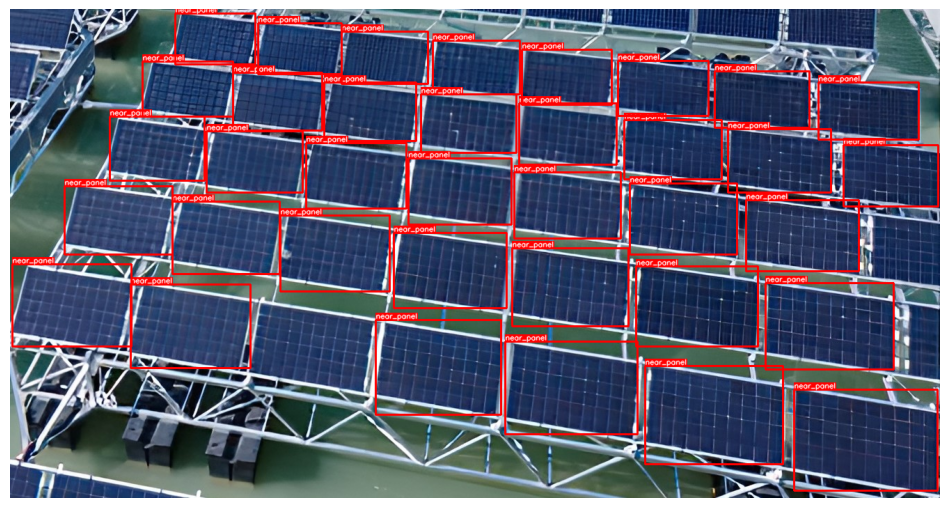

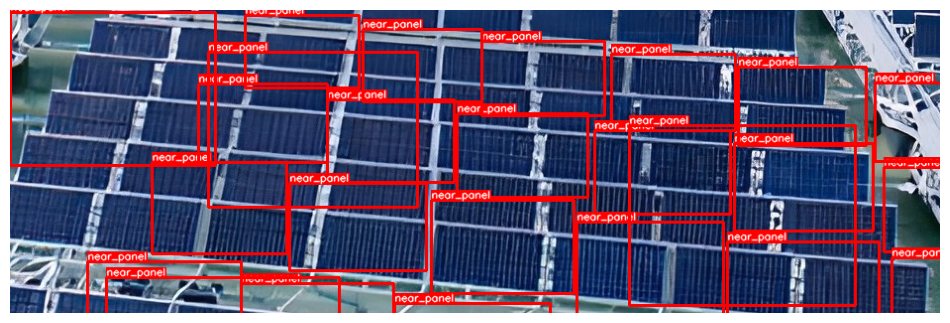

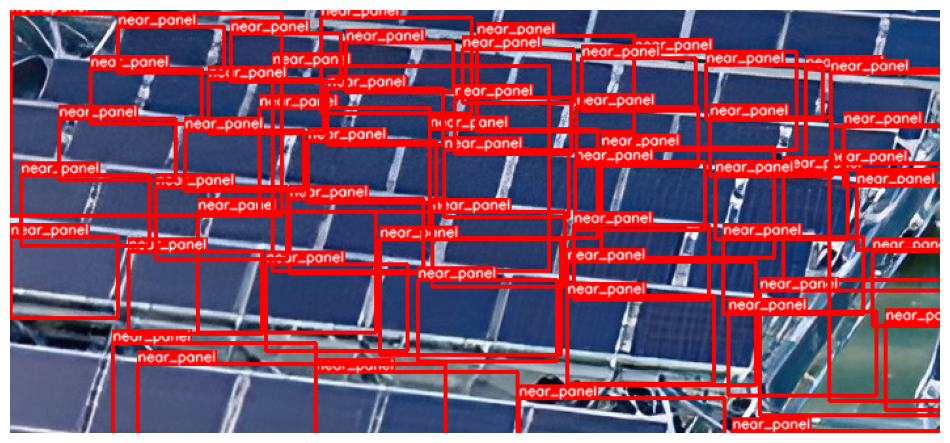

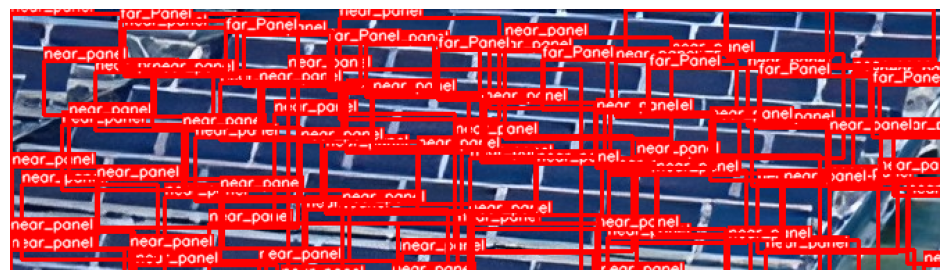

In [15]:
import json
image_id_lst  = list(range(1,6))
our_file = "/kaggle/input/data-para-results/4000_par.json"
    # Assuming you have a JSON file named 'data.json' containing JSON data

file_lst  = ["enlarge_given_image (1)","enlarge_given_image (3)","enlarge_given_image (4)","enlarge_given_image (5)"]
path_to_files = "/kaggle/input/coco-solar/soure_1/soure/train_old/"
print(len(image_id_lst), len(file_lst))

with open(our_file, 'r') as json_file:
    data = json.load(json_file)
    bbox_lst = []
    category_ids_lst = []

for image_id, file in zip(image_id_lst, file_lst):
    for out_dict in data:
        #print(out_dict)
        if out_dict["image_id"] == image_id:
            bbox_lst.append(out_dict["bbox"])
            category_ids_lst.append(out_dict['category_id'])
    print(len(category_ids_lst))
    category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}
    print(image_id, file)
    file_path = str(path_to_files) + str(file) +'.jpg'
    print(f"filepath = {file_path}")
    image = cv2.imread(file_path)
    print(f"image_shape={image.shape}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # visualize(image, bboxes, category_ids, category_id_to_name)
    visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

**Final_prediction**

66


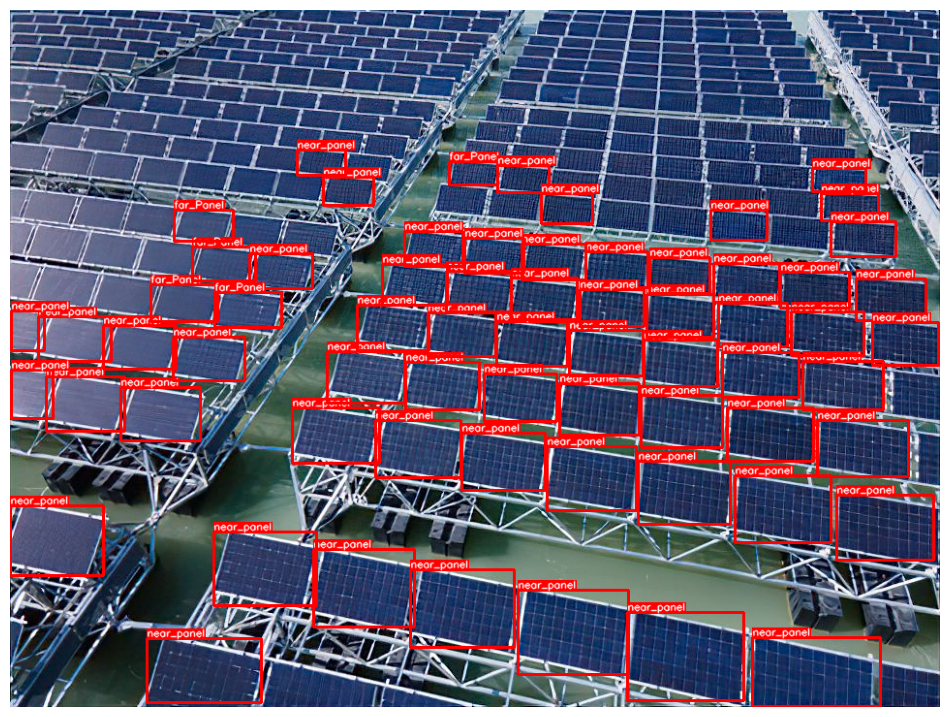

In [16]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/threshold_4.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

100


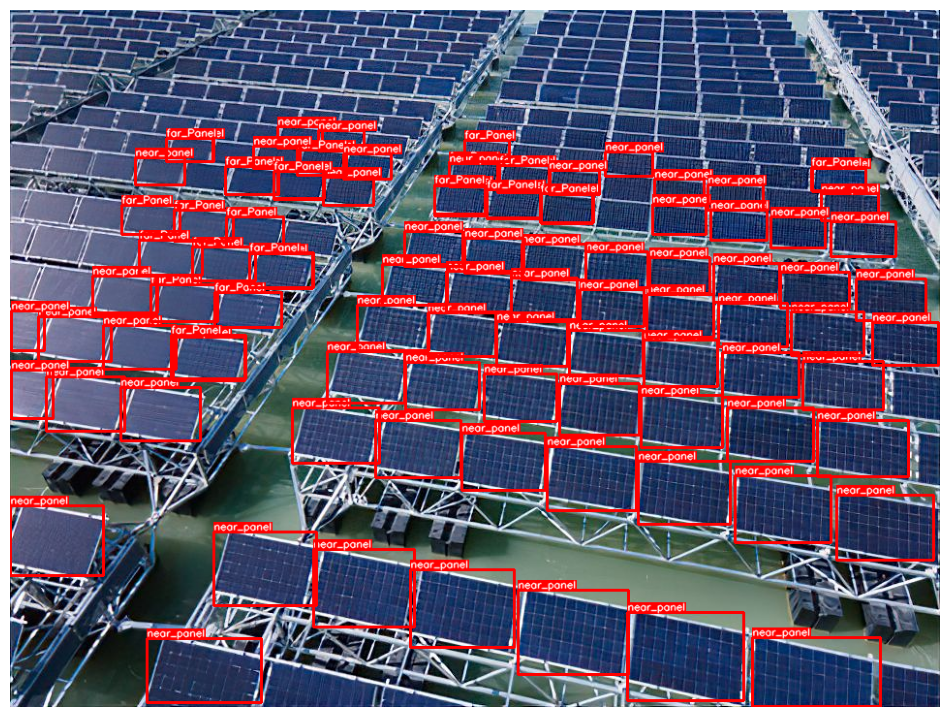

In [17]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/thershold_01.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

139


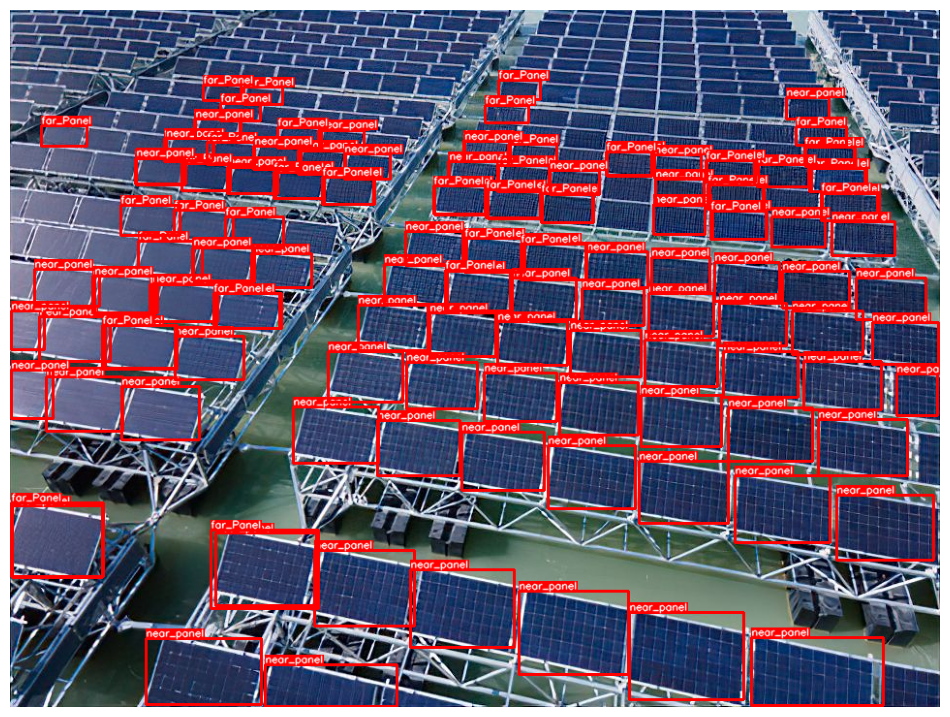

In [18]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/trian_350.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

223


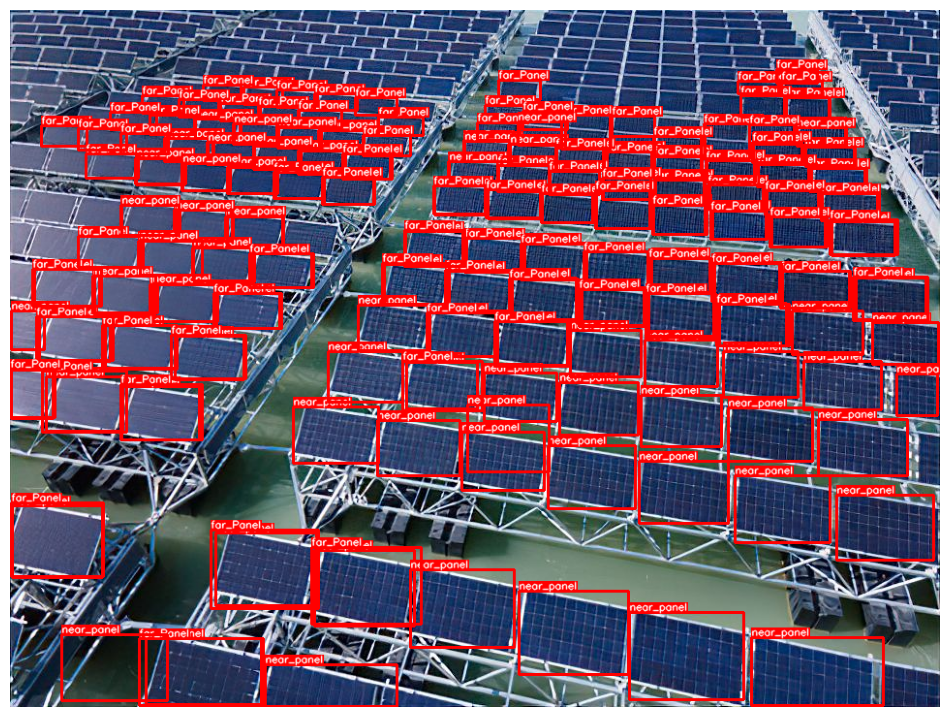

In [19]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/train_001.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)